# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

### Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

It could be interesting to try to predict used car prices based on certain attributes. Based on the dataset given, some data questions that can be asked
are:
Can the price of the car be related to the odometer?
Can the price of the car be related to year?
Can the price of the car be predicted based on its attributes with resonable accuracy?

### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

Steps to start to get to know the dataset:
Checking the number of features and rows.
Checking for missing data and determine how it can affect the dataset.
Checking info, describe and head to get a snapshot of the dataset.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import TargetEncoder
from sklearn.preprocessing import OrdinalEncoder

In [2]:
car_df = pd.read_csv('data/vehicles.csv')

In [3]:
car_df.shape

(426880, 18)

In [4]:
car_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            426880 non-null  int64  
 1   region        426880 non-null  object 
 2   price         426880 non-null  int64  
 3   year          425675 non-null  float64
 4   manufacturer  409234 non-null  object 
 5   model         421603 non-null  object 
 6   condition     252776 non-null  object 
 7   cylinders     249202 non-null  object 
 8   fuel          423867 non-null  object 
 9   odometer      422480 non-null  float64
 10  title_status  418638 non-null  object 
 11  transmission  424324 non-null  object 
 12  VIN           265838 non-null  object 
 13  drive         296313 non-null  object 
 14  size          120519 non-null  object 
 15  type          334022 non-null  object 
 16  paint_color   296677 non-null  object 
 17  state         426880 non-null  object 
dtypes: f

In [5]:
car_df.describe()

,id,price,year,odometer
count,4.268800e+05,4.268800e+05,425675.000000,4.224800e+05
mean,7.311487e+09,7.519903e+04,2011.235191,9.804333e+04
std,4.473170e+06,1.218228e+07,9.452120,2.138815e+05
min,7.207408e+09,0.000000e+00,1900.000000,0.000000e+00
25%,7.308143e+09,5.900000e+03,2008.000000,3.770400e+04
50%,7.312621e+09,1.395000e+04,2013.000000,8.554800e+04
75%,7.315254e+09,2.648575e+04,2017.000000,1.335425e+05
max,7.317101e+09,3.736929e+09,2022.000000,1.000000e+07


In [6]:
car_df.head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl
3,7222270760,worcester / central MA,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma
4,7210384030,greensboro,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc


### Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

In [7]:
car_df.isnull().sum()

id                   0
region               0
price                0
year              1205
manufacturer     17646
model             5277
condition       174104
cylinders       177678
fuel              3013
odometer          4400
title_status      8242
transmission      2556
VIN             161042
drive           130567
size            306361
type             92858
paint_color     130203
state                0
dtype: int64

In [8]:
(car_df.isnull().sum() / car_df.shape[0] * 100).sort_values(ascending=True)

id               0.000000
price            0.000000
state            0.000000
region           0.000000
year             0.282281
transmission     0.598763
fuel             0.705819
odometer         1.030735
model            1.236179
title_status     1.930753
manufacturer     4.133714
type            21.752717
paint_color     30.501078
drive           30.586347
VIN             37.725356
condition       40.785232
cylinders       41.622470
size            71.767476
dtype: float64

In [9]:
df = car_df.dropna()
df.shape

(34868, 18)

In [10]:
df.isnull().sum()

id              0
region          0
price           0
year            0
manufacturer    0
model           0
condition       0
cylinders       0
fuel            0
odometer        0
title_status    0
transmission    0
VIN             0
drive           0
size            0
type            0
paint_color     0
state           0
dtype: int64

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 34868 entries, 126 to 426836
Data columns (total 18 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   id            34868 non-null  int64  
 1   region        34868 non-null  object 
 2   price         34868 non-null  int64  
 3   year          34868 non-null  float64
 4   manufacturer  34868 non-null  object 
 5   model         34868 non-null  object 
 6   condition     34868 non-null  object 
 7   cylinders     34868 non-null  object 
 8   fuel          34868 non-null  object 
 9   odometer      34868 non-null  float64
 10  title_status  34868 non-null  object 
 11  transmission  34868 non-null  object 
 12  VIN           34868 non-null  object 
 13  drive         34868 non-null  object 
 14  size          34868 non-null  object 
 15  type          34868 non-null  object 
 16  paint_color   34868 non-null  object 
 17  state         34868 non-null  object 
dtypes: float64(2), int64(2), obj

In [12]:
df.head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
126,7305672709,auburn,0,2018.0,chevrolet,express cargo van,like new,6 cylinders,gas,68472.0,clean,automatic,1GCWGAFP8J1309579,rwd,full-size,van,white,al
127,7305672266,auburn,0,2019.0,chevrolet,express cargo van,like new,6 cylinders,gas,69125.0,clean,automatic,1GCWGAFP4K1214373,rwd,full-size,van,white,al
128,7305672252,auburn,0,2018.0,chevrolet,express cargo van,like new,6 cylinders,gas,66555.0,clean,automatic,1GCWGAFPXJ1337903,rwd,full-size,van,white,al
215,7316482063,birmingham,4000,2002.0,toyota,echo,excellent,4 cylinders,gas,155000.0,clean,automatic,JTDBT123520243495,fwd,compact,sedan,blue,al
219,7316429417,birmingham,2500,1995.0,bmw,525i,fair,6 cylinders,gas,110661.0,clean,automatic,WBAHD6322SGK86772,rwd,mid-size,sedan,white,al


Year and odometer have minimal entries missing with 0.28% and 1.03% respetively. For the purpose of the questions that is trying to be answerd dropping all NA values should not affect the dataset.

In [13]:
df = df.query('odometer < 500000')

In [14]:
df = df.query('price > 100')

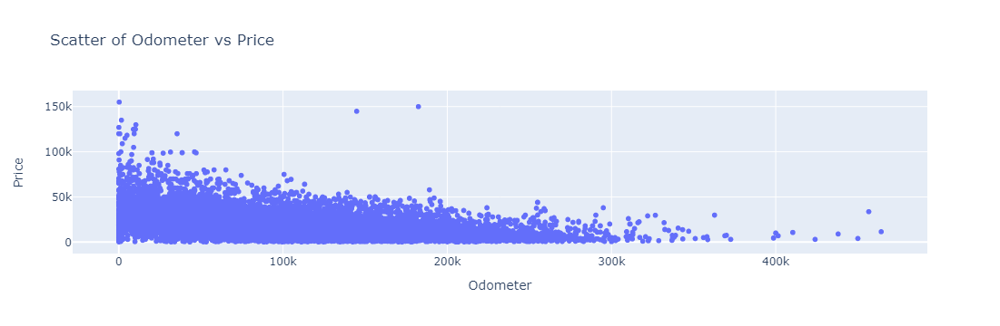

In [15]:
fig1 = px.scatter(df, x='odometer', y='price', title='Scatter of Odometer vs Price', labels={'odometer': 'Odometer'})
fig1.update_yaxes(title ='Price')
fig1.show()

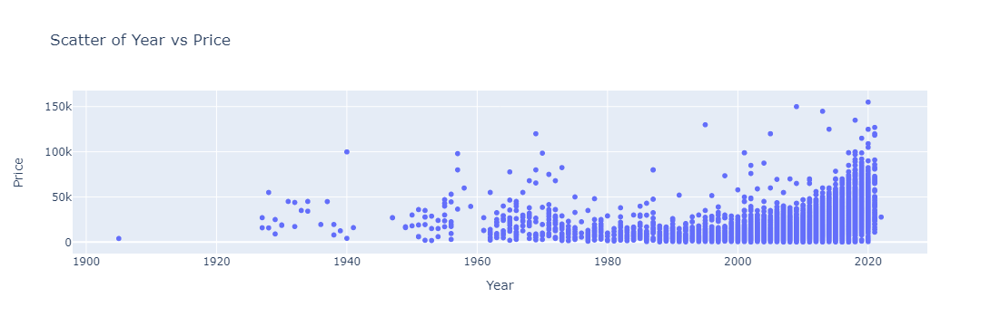

In [16]:
fig2 = px.scatter(df, x='year', y='price', title='Scatter of Year vs Price', labels={'year': 'Year'})
fig2.update_yaxes(title ='Price')
fig2.show()

In [17]:
num_df = df[['price', 'year', 'odometer']]

In [18]:
num_df.corr()

,price,year,odometer
price,1.000000,0.343582,-0.443940
year,0.343582,1.000000,-0.287271
odometer,-0.443940,-0.287271,1.000000


<Axes: >

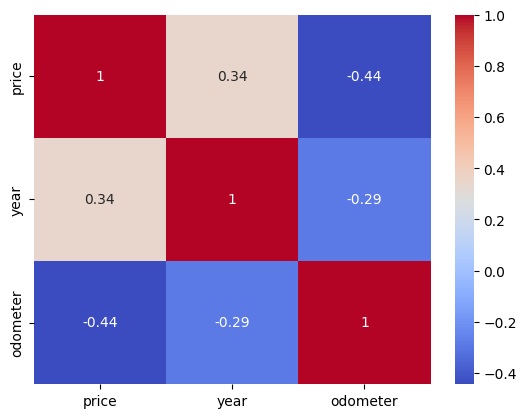

In [19]:
sns.heatmap(num_df.corr(), annot=True, cmap = 'coolwarm')

See trend of as odometer goes up, price goes down. For year, the more recent the year of the car, the price goes up. Looking at corelation, there is a positive correlation between year and price, and a negative correlation between odometer and price which is what was expected from looking at the trend.

In [20]:
hashmap = {}
for column in df.drop(['price', 'year', 'odometer'], axis=1):
    hashmap[column] = len(df[column].unique())
pd.Series(hashmap)

id              31738
region            390
manufacturer       41
model            4928
condition           6
cylinders           8
fuel                5
title_status        6
transmission        3
VIN             20526
drive               3
size                4
type               13
paint_color        12
state              51
dtype: int64

In [21]:
cols_to_drop = ['id', 'VIN', 'model']
y = df['price']
ohe_cols = ['transmission', 'drive', 'size']
target_cols = ['region', 'manufacturer', 'condition', 'cylinders', 'fuel', 'title_status', 'type', 'paint_color', 'state']
# target_cols = ['region', 'state']
tmp_df = df.drop(cols_to_drop, axis=1)
# tmp_df.query('price > 100').sort_values('price')
# tmp_tmp = tmp_df.query('price > 100')
# enc_auto = TargetEncoder()
# df_target_enc = enc_auto.fit_transform(tmp_df[target_cols], y)
# df_target_enc
enc = OneHotEncoder(sparse_output = False)
temp = enc.fit_transform(tmp_df[ohe_cols])
ohc_df = pd.DataFrame(temp, columns = enc.get_feature_names_out())
ohc_df.reset_index()

,index,transmission_automatic,transmission_manual,transmission_other,drive_4wd,drive_fwd,drive_rwd,size_compact,size_full-size,size_mid-size,size_sub-compact
0,0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
1,1,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,2,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
3,3,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
4,4,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
31733,31733,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
31734,31734,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
31735,31735,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
31736,31736,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0


In [22]:
ordinalEnc = OrdinalEncoder()
tempp = ordinalEnc.fit_transform(tmp_df[target_cols])
tempp
ord_df = pd.DataFrame(tempp, columns = ordinalEnc.get_feature_names_out())
ord_df.reset_index()

,index,region,manufacturer,condition,cylinders,fuel,title_status,type,paint_color,state
0,0,28.0,38.0,0.0,3.0,2.0,0.0,9.0,1.0,1.0
1,1,28.0,4.0,1.0,5.0,2.0,0.0,9.0,10.0,1.0
2,2,28.0,25.0,0.0,3.0,2.0,0.0,2.0,10.0,1.0
3,3,28.0,13.0,0.0,5.0,2.0,0.0,10.0,10.0,1.0
4,4,28.0,26.0,1.0,5.0,2.0,0.0,3.0,9.0,1.0
...,...,...,...,...,...,...,...,...,...,...
31733,31733,383.0,13.0,3.0,6.0,2.0,0.0,10.0,0.0,50.0
31734,31734,383.0,7.0,3.0,3.0,2.0,0.0,9.0,9.0,50.0
31735,31735,383.0,13.0,0.0,6.0,0.0,0.0,8.0,2.0,50.0
31736,31736,383.0,7.0,0.0,3.0,2.0,0.0,9.0,0.0,50.0


In [23]:
df[['price', 'year', 'odometer']].reset_index()

,index,price,year,odometer
0,215,4000,2002.0,155000.0
1,219,2500,1995.0,110661.0
2,268,9000,2008.0,56700.0
3,337,8950,2011.0,164000.0
4,338,4000,1972.0,88100.0
...,...,...,...,...
31733,426785,23495,2015.0,146795.0
31734,426788,12995,2016.0,61127.0
31735,426792,32999,2014.0,154642.0
31736,426793,15999,2018.0,36465.0


In [24]:
combine_df = pd.concat([df[['price', 'year', 'odometer']].reset_index(), ohc_df.reset_index(), ord_df.reset_index()], axis=1)
combine_df

,index,price,year,odometer,index,transmission_automatic,transmission_manual,transmission_other,drive_4wd,drive_fwd,...,index,region,manufacturer,condition,cylinders,fuel,title_status,type,paint_color,state
0,215,4000,2002.0,155000.0,0,1.0,0.0,0.0,0.0,1.0,...,0,28.0,38.0,0.0,3.0,2.0,0.0,9.0,1.0,1.0
1,219,2500,1995.0,110661.0,1,1.0,0.0,0.0,0.0,0.0,...,1,28.0,4.0,1.0,5.0,2.0,0.0,9.0,10.0,1.0
2,268,9000,2008.0,56700.0,2,1.0,0.0,0.0,0.0,0.0,...,2,28.0,25.0,0.0,3.0,2.0,0.0,2.0,10.0,1.0
3,337,8950,2011.0,164000.0,3,1.0,0.0,0.0,0.0,1.0,...,3,28.0,13.0,0.0,5.0,2.0,0.0,10.0,10.0,1.0
4,338,4000,1972.0,88100.0,4,1.0,0.0,0.0,0.0,0.0,...,4,28.0,26.0,1.0,5.0,2.0,0.0,3.0,9.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31733,426785,23495,2015.0,146795.0,31733,1.0,0.0,0.0,1.0,0.0,...,31733,383.0,13.0,3.0,6.0,2.0,0.0,10.0,0.0,50.0
31734,426788,12995,2016.0,61127.0,31734,1.0,0.0,0.0,0.0,1.0,...,31734,383.0,7.0,3.0,3.0,2.0,0.0,9.0,9.0,50.0
31735,426792,32999,2014.0,154642.0,31735,1.0,0.0,0.0,1.0,0.0,...,31735,383.0,13.0,0.0,6.0,0.0,0.0,8.0,2.0,50.0
31736,426793,15999,2018.0,36465.0,31736,1.0,0.0,0.0,0.0,1.0,...,31736,383.0,7.0,0.0,3.0,2.0,0.0,9.0,0.0,50.0


<Axes: >

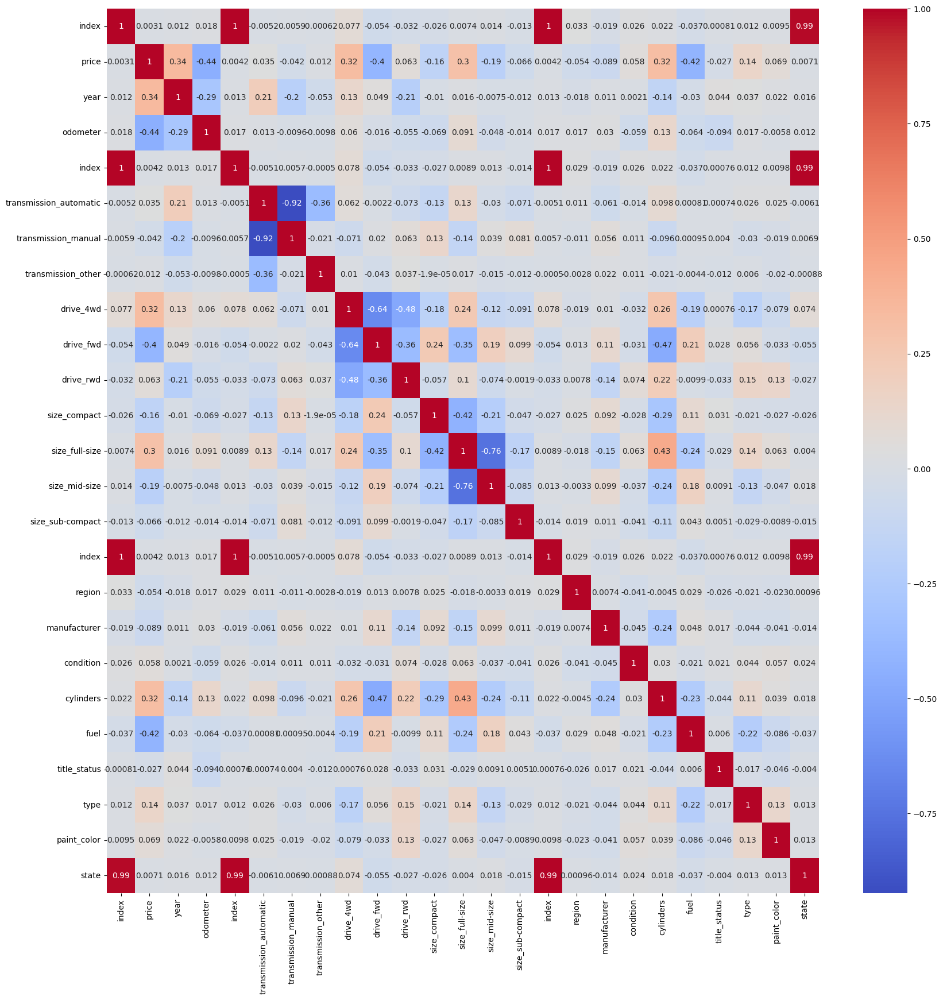

In [25]:
plt.figure(figsize = (20, 20))
sns.heatmap(combine_df.corr(), annot=True, cmap='coolwarm')

After using One Hot Encoder and Ordinal Encoder for string categories, upon looking at correlation, some other notable features to look into are:
drive_4wd has high positive correlation
drive_fwd has high negative correlation
size_fullsize has high positive correlation
cylinders has high positive correlation
fuel has high negative correlation

### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

In [26]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SequentialFeatureSelector, SelectFromModel, RFE
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn import set_config

In [27]:
combine_df.columns

Index(['index', 'price', 'year', 'odometer', 'index', 'transmission_automatic',
       'transmission_manual', 'transmission_other', 'drive_4wd', 'drive_fwd',
       'drive_rwd', 'size_compact', 'size_full-size', 'size_mid-size',
       'size_sub-compact', 'index', 'region', 'manufacturer', 'condition',
       'cylinders', 'fuel', 'title_status', 'type', 'paint_color', 'state'],
      dtype='object')

In [28]:
model_cols = ['price', 'year', 'odometer', 'drive_4wd', 'drive_fwd', 'size_full-size', 'cylinders', 'fuel']
model_df = combine_df[model_cols]

In [29]:
scaler = StandardScaler()
y = model_df['price']
Xnorm = scaler.fit_transform(model_df)
pd.DataFrame(Xnorm)

,0,1,2,3,4,5,6,7
0,-1.020210,-1.215480,0.826271,-0.927564,1.438555,-1.217316,-1.187413,0.281221
1,-1.134550,-2.177255,0.038646,-0.927564,-0.695142,-1.217316,0.313906,0.281221
2,-0.639077,-0.391102,-0.919901,-0.927564,-0.695142,-1.217316,-1.187413,0.281221
3,-0.642889,0.021087,0.986145,-0.927564,1.438555,0.821479,0.313906,0.281221
4,-1.020210,-5.337371,-0.362121,-0.927564,-0.695142,0.821479,0.313906,0.281221
...,...,...,...,...,...,...,...,...
31733,0.465825,0.570672,0.680520,1.078093,-0.695142,0.821479,1.064566,0.281221
31734,-0.334553,0.708069,-0.841261,-0.927564,1.438555,-1.217316,-1.187413,0.281221
31735,1.190282,0.433276,0.819912,1.078093,-0.695142,0.821479,1.064566,-3.119571
31736,-0.105568,0.982862,-1.279350,-0.927564,1.438555,-1.217316,-1.187413,0.281221


In [50]:
pca = PCA(n_components=2)
Xpca = pca.fit_transform(Xnorm)
pd.DataFrame(Xpca)

,0,1
0,-2.681576,0.843437
1,-1.156172,1.655237
2,-1.342109,-0.562956
3,-1.051723,0.837546
4,-0.600213,3.460083
...,...,...
31733,1.645712,0.498188
31734,-2.137234,-1.559253
31735,3.015092,0.326297
31736,-1.993106,-2.081376


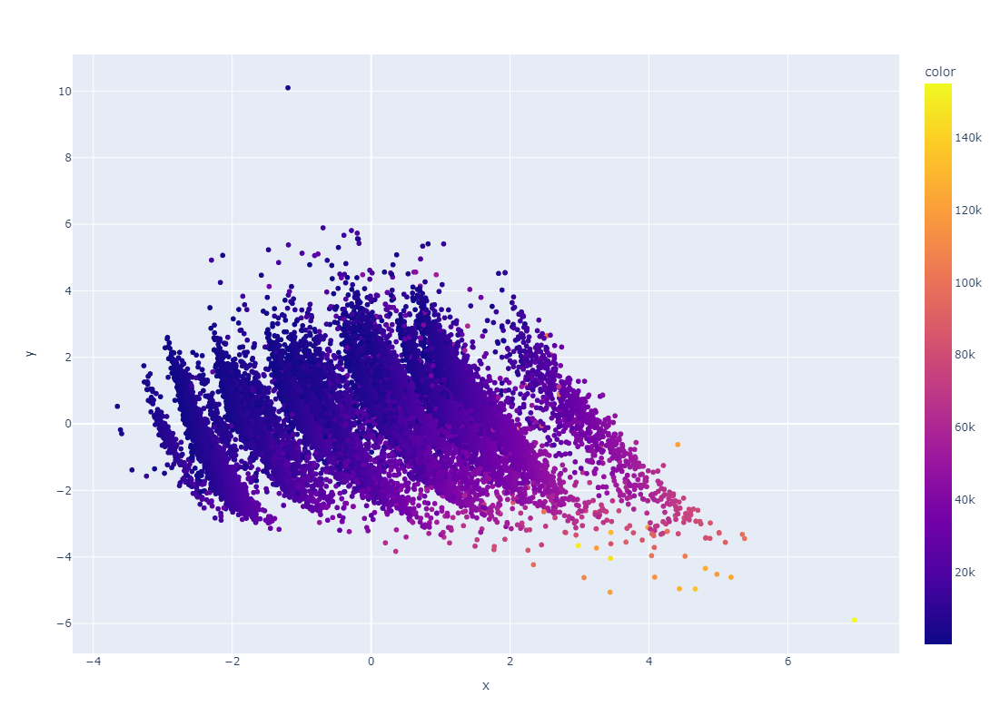

In [49]:
px.scatter(Xpca, x= Xpca[:,0], y= Xpca[:,1], color=y, height=800)

In [32]:
inertias = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, random_state=42).fit(Xpca)
    inertias.append(kmeans.inertia_)

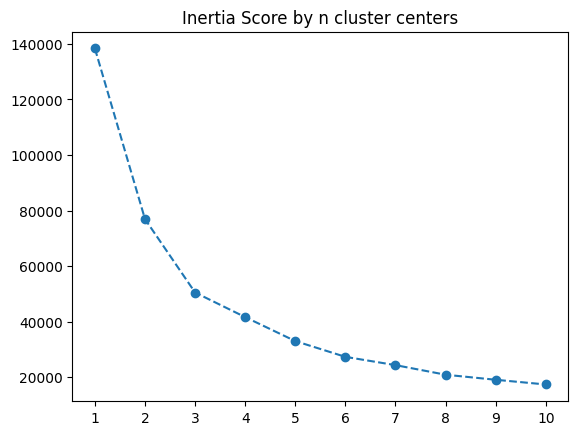

In [33]:
plt.plot(list(range(1, 11)), inertias, '--o')
plt.xticks(list(range(1, 11)), list(range(1, 11)))
plt.title('Inertia Score by n cluster centers');

In [34]:
kmeans = KMeans(n_clusters=4).fit(Xpca)
model_df['cluster'] = kmeans.labels_
y = model_df['cluster']

C:\Users\Terrence\AppData\Local\Temp\ipykernel_20320\2017045509.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



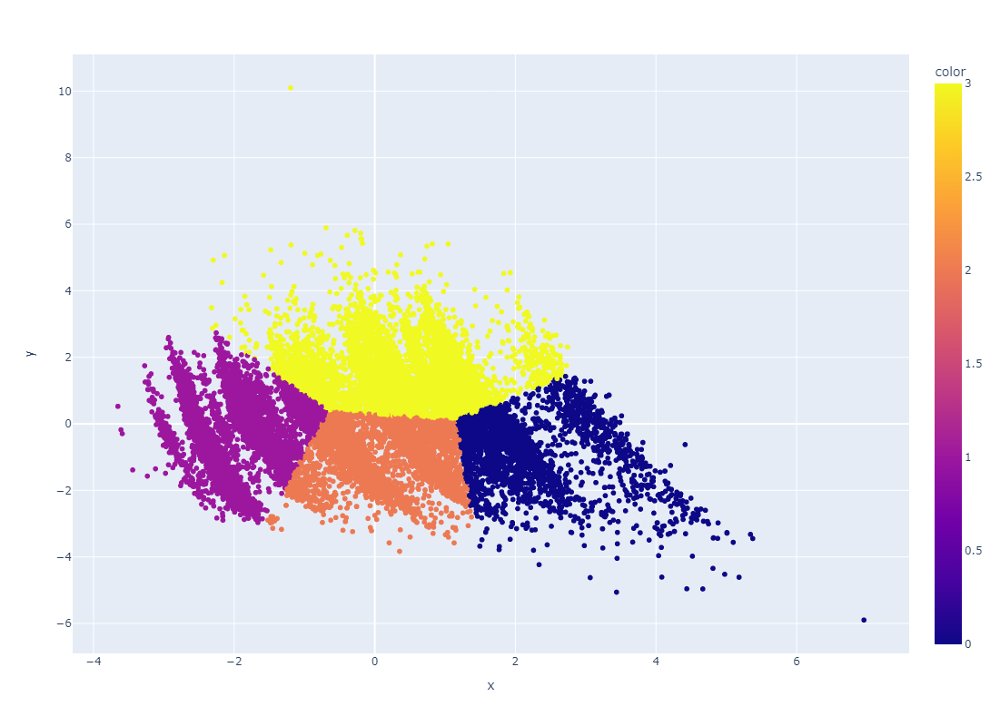

In [35]:
px.scatter(Xpca, x= Xpca[:,0], y= Xpca[:,1], color=y, height=800)

In [36]:
X = model_df.drop(['price', 'cluster'], axis=1)
y = model_df['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3,random_state = 42)

In [37]:
pipe = Pipeline([('polyfeatures', PolynomialFeatures(degree = 1, include_bias = False)),
                      ('scaler', StandardScaler()),
                     ('lasso', Lasso())])
pipe.fit(X_train, y_train)
lasso_coefs = pipe.named_steps['lasso'].coef_
lasso_coefs

array([ 3056.50253954, -5646.54416551,   867.51481403, -2409.52433399,
        1245.5705695 ,  2379.21348979, -4278.26159531])

In [38]:
lasso_train_mse = mean_squared_error(y_train, pipe.predict(X_train))
lasso_test_mse = mean_squared_error(y_test, pipe.predict(X_test))
print(lasso_train_mse)
print(lasso_test_mse)

70500925.78192995
69385179.60703374


In [39]:
feature_names = pipe.named_steps['polyfeatures'].get_feature_names_out()
lasso_df = pd.DataFrame({'feature': feature_names, 'coef': lasso_coefs})
lasso_df.sort_values('coef', key=abs, ascending=False)

,feature,coef
1,odometer,-5646.544166
6,fuel,-4278.261595
0,year,3056.502540
3,drive_fwd,-2409.524334
5,cylinders,2379.213490
4,size_full-size,1245.570570
2,drive_4wd,867.514814


In [40]:
sequential_pipe = Pipeline([('scaler', StandardScaler()),
                           ('selector', SequentialFeatureSelector(Lasso(),
                                                                  n_features_to_select=4)),
                            ('ridge', Ridge())])
sequential_pipe.fit(X_train, y_train)
sequential_train_mse = mean_squared_error(y_train, sequential_pipe.predict(X_train))
sequential_test_mse = mean_squared_error(y_test, sequential_pipe.predict(X_test))
print(sequential_train_mse, sequential_test_mse)

77631486.3672506 77297563.88485795


In [41]:
seq_coef = sequential_pipe.named_steps['ridge'].coef_
seq_coef

array([ 3054.70959584, -5245.82580613, -4411.14726493, -4866.82759526])

In [42]:
feature_names = X_train.columns[sequential_pipe.named_steps['selector'].get_support()]
seq_df = pd.DataFrame({'feature': feature_names, 'coef': seq_coef})
seq_df

,feature,coef
0,year,3054.709596
1,odometer,-5245.825806
2,drive_fwd,-4411.147265
3,fuel,-4866.827595


In [43]:
rfe_pipe = Pipeline([('scaler', StandardScaler()),
                           ('selector', RFE(Lasso(),
                                                                  n_features_to_select=4)),
                            ('ridge', Ridge())])
rfe_pipe.fit(X_train, y_train)
rfe_train_mse = mean_squared_error(y_train, rfe_pipe.predict(X_train))
rfe_test_mse = mean_squared_error(y_test, rfe_pipe.predict(X_test))
print(rfe_train_mse, rfe_test_mse)

77631486.3672506 77297563.88485795


In [44]:
rfe_coef = rfe_pipe.named_steps['ridge'].coef_
rfe_coef

array([ 3054.70959584, -5245.82580613, -4411.14726493, -4866.82759526])

In [45]:
feature_names = X_train.columns[rfe_pipe.named_steps['selector'].get_support()]
rfe_df = pd.DataFrame({'feature': feature_names, 'coef': rfe_coef})
rfe_df

,feature,coef
0,year,3054.709596
1,odometer,-5245.825806
2,drive_fwd,-4411.147265
3,fuel,-4866.827595


### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

Findings analysis:
Using Lasso model, top four features based on coef are:
odometer	-5646.544166
fuel	-4278.261595
year	3056.502540
drive_fwd	-2409.524334

Using Ridge Model, top four features based on coef are:
year	3054.709596
odometer	-5245.825806
drive_fwd	-4411.147265
fuel	-4866.827595

Lasso had mean squared error for training and test sets as 70500925.78192995 and 69385179.60703374 respectively.
Ridge had mean squared error for training and test sets as 77631486.3672506 and 77297563.88485795 respectively.

Both models include the same 4 features of odometer, fuel, year, and specifically forward drive.


### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.

In [ ]:
Based on evaluation above, a suggested that odometer reading, year the car was made, forward drive, and fuel type are more important factors in what
affects the price of a used car. In turn, that can mean that is what customers are looking into. I used use this to test stocking more cars based on
these findings re-evaluated some time later this year to see if sales have been affected and if any extra analysis can be done.

In the future, subseting the fuel feature like what was done for drive train can be useful in determining what type of fuel car affects the price greater.